First bit of eda into python

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import skew, kurtosis
import seaborn as sns
from sklearn.cluster import KMeans

from arch import arch_model

import gc
from tqdm import tqdm


import glob
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import adfuller, acf
import warnings


In [2]:
# # Save the combined DataFrame to CSV
# combined_path = "C:/Users/ryatu/Documents/optiver_data/Optiver_additional data/order_book_combined.csv"
# df_combined.to_csv(combined_path, index=False)
# print(f"Combined data saved to {combined_path}")

# Load the previously saved combined DataFrame
df_combined = pd.read_csv("C:/Users/ryatu/Documents/optiver_data/Optiver_additional data/order_book_combined.csv")

In [3]:
df_combined.head()

,stock_id,time_id,seconds_in_bucket,bid_price1,ask_price1,bid_price2,ask_price2,bid_size1,ask_size1,bid_size2,ask_size2,wap,BidAskSpread,spread,log_return,realized_volatility,time_bucket,imbalance
0,8382,6,1800.0,740.03,740.29,740.0,740.30,6,6,800,40,740.160000,0.000351,0.26,0.000000,0.011885,60,0.000000
1,8382,6,1800.0,740.03,740.29,740.0,740.30,6,6,800,40,740.160000,0.000351,0.26,0.000000,0.011885,60,0.000000
2,8382,6,1801.0,740.05,740.29,740.0,740.30,25,1,99,40,740.280769,0.000324,0.24,0.000163,0.011885,61,0.923077
3,8382,6,1801.0,740.05,740.29,740.0,740.30,25,1,99,40,740.280769,0.000324,0.24,0.000000,0.011885,61,0.923077
4,8382,6,1802.0,740.06,740.36,740.0,740.39,100,30,399,4,740.290769,0.000405,0.30,0.000014,0.011885,61,0.538462


### Main: additional stocks into df

change this : this is for the feature / target csv 



Information about the contents of Optiver_additional_data.zip

- "order_book_feature.csv" and "order_book_target.csv" contain information on order book snapshots, like the dataset we are using now. The parquet files store the same dataset indicated by the file name.

- "stock_ids.csv" contains the names of stocks.

- "time_id_reference.csv" contains the real-time of each time id.

- "trades.csv" contains stock transaction information, including the stock price and size.

- "train.csv" contains the "target", which is the actual volatility for a 30-minute window.

Some remarks:

1. Time id is sequential now and 1 time id represents 1 hour.

2. You need to combine two order book files together to do further study. With the same time id, the "feature" contains the information for the first 30 min (seconds_in_bucket from 0 - 1799), and the "target" contains the information for the last 30 min (seconds_in_bucket from 1800 - 3599).

3. "trades.csv" is arguably less useful for this project RE: calculating realized volatility from log-returns (the order book files would be preferrable here), but may be an interesting feature as it can indicate market liquidity.

4. The "target" in "train.csv" is the volatility for the last 30 minutes in one hour, so it can be calculated from the "order_book_target" file directly. You can ignore this file too.

In [5]:
# import pandas as pd

# stock_0 = pd.read_parquet("C:/Users/ryatu/Documents/optiver_data/individual_book_train/stock_0.parquet")

# # stock_0

# csv_folder = "C:/Users/ryatu/Documents/optiver_data/individual_book_train"
# parquet_folder = "C:/Users/ryatu/Documents/optiver_data/individual_book_train"

# for i in range(10):  # adjust range if you have more files
#     csv_file = os.path.join(csv_folder, f"stock_{i}.csv")
#     parquet_file = os.path.join(parquet_folder, f"stock_{i}.parquet")
    
#     if os.path.exists(csv_file):
#         df = pd.read_csv(csv_file)  # ← read the CSV first
#         df.to_parquet(parquet_file)  # ← save it as Parquet
#         print(f"Converted: stock_{i}.csv → stock_{i}.parquet")
#     else:
#         print(f"File not found: stock_{i}.csv (skipped)")




In [6]:
# # features: Order book snapshots for the first 30 minutes of each 1-hour time window (seconds_in_bucket 0–1799).	
# feature = pd.read_csv("C:/Users/ryatu/Documents/optiver_data/Optiver_additional data/order_book_feature.csv", sep='\t')

# # features = pd.read_parquet(
# #     r"C:/Users/ryatu/Documents/optiver_data/Optiver_additional data/order_book_feature.parquet"
# # )
# # filter_feature = feature[1790:1800]
# # filter_feature

In [7]:
# # targets: Order book snapshots for the last 30 minutes of each 1-hour time window (seconds_in_bucket 1800–3599).	
# target = pd.read_csv("C:/Users/ryatu/Documents/optiver_data/Optiver_additional data/order_book_target.csv", sep='\t')

# # target = pd.read_parquet(
# #     r"C:/Users/ryatu/Documents/optiver_data/Optiver_additional data/order_book_target.parquet"
# # )

# # m 1800 - 3599).

In [8]:
# # Stack them: feature first, then target
# df_combined = pd.concat([feature, target], ignore_index=True)

# # Optional: Sort if you want by stock_id, time_id, and seconds_in_bucket
# df_combined = df_combined.sort_values(by=['stock_id', 'time_id', 'seconds_in_bucket']).reset_index(drop=True)

# ## joining / merge by sorting uni identifiers 'seconds_in_buckets' determines the sequence 


### Addtional Information file: load all into df functions to add on 

In [32]:
def compute_wap_and_spread(df):
    # Compute WAP (Weighted Average Price)
    denom = df["bid_size1"] + df["ask_size1"]
    df["wap"] = np.where(denom != 0,
                         (df["bid_price1"] * df["ask_size1"] + df["ask_price1"] * df["bid_size1"]) / denom,
                         np.nan)
    
    # Calculate Bid-Ask Spread
    df["BidAskSpread"] = np.where(df["bid_price1"] != 0,
                                  df["ask_price1"] / df["bid_price1"] - 1,
                                  np.nan)
    
    # Calculate the spread between ask and bid prices
    df["spread"] = df["ask_price1"] - df["bid_price1"]
    
    # Handle NaN values in 'wap', 'BidAskSpread', and 'spread'
    df['wap'] = df['wap'].fillna(method='ffill').fillna(method='bfill')  # Fill forward and backward
    df['BidAskSpread'] = df['BidAskSpread'].fillna(0)  # Fill with 0 as no spread can exist
    df['spread'] = df['spread'].fillna(0)  # Same for spread
    
    return df
    


def compute_log_return(df):

    print(" 1/3 sorting data by tock id , time_id, seconds_in_bucket")
    
    df = df.sort_values(['stock_id', 'time_id', 'seconds_in_bucket'])

    
    print(" 2/3 computing log returns grouped by stock_id and time_id")

    df['log_return'] = (
        df.groupby(['stock_id', 'time_id'])['wap']
        .transform(lambda x: np.log(x / x.shift(1)))
    )
    print("[3/3] Filling NaNs in log_return with 0...")

    df['log_return'] = df['log_return'].fillna(0)
    
    return df


def assign_time_buckets(df):
    df['time_bucket'] = np.ceil(df['seconds_in_bucket'] / 30).astype(int)
    return df

def compute_realized_volatility(df):
    print("[1/5] Checking necessary columns...")
    required_cols = ['stock_id', 'time_id', 'seconds_in_bucket', 'log_return']
    missing_cols = [col for col in required_cols if col not in df.columns]
    if missing_cols:
        raise ValueError(f"Missing columns: {missing_cols}")

    print("[2/5] Sorting by stock_id, time_id, seconds_in_bucket...")
    df = df.sort_values(['stock_id', 'time_id', 'seconds_in_bucket'], kind='mergesort')

    print("[3/5] Computing realized volatility per group (vectorized)...")
    vol = (
        df.groupby(["stock_id", "time_id"])['log_return']
        .agg(lambda x: np.sqrt((x**2).sum()))
        .reset_index()
        .rename(columns={"log_return": "realized_volatility"})
    )

    print("[4/5] Merging realized volatility back to original df...")
    df = df.merge(vol, on=["stock_id", "time_id"], how="left")

    print("✅ Done computing realized volatility!")
    return df




def compute_imbalance(df):
    total_volume = df['bid_size1'] + df['ask_size1']
    df['imbalance'] = (df['bid_size1'] - df['ask_size1']) / total_volume.replace(0, np.nan)
    return df

# def global_seconds(df):
#     time_id_mapping = {tid: i for i, tid in enumerate(sorted(df['time_id'].unique()))}
#     df['global_seconds'] = df['seconds_in_bucket'] + df['time_id'].map(time_id_mapping) * 600
#     return df


# def fill_missing_seconds(df):
#     print("[1/5] Loading data with Dask to avoid memory issues...")
    
#     # Converting the pandas DataFrame to Dask DataFrame to handle large datasets
#     df = dd.from_pandas(df, npartitions=8)  # Adjust the number of partitions based on your system

#     print("[2/5] Preparing static seconds template...")
#     # Create a static template for 'seconds_in_bucket'
#     seconds_template = pd.DataFrame({'seconds_in_bucket': np.arange(600)})
#     seconds_template = dd.from_pandas(seconds_template, npartitions=1)  # Convert seconds template to Dask

#     print("[3/5] Grouping by stock_id and time_id...")
#     grouped = df.groupby(['stock_id', 'time_id'], sort=False)  # Group by stock_id and time_id without sorting
    
#     filled_list = []
    
#     # Identify only the columns that need forward filling (exclude ID columns)
#     ffill_cols = [col for col in df.columns if col not in ['stock_id', 'time_id', 'seconds_in_bucket']]
    
#     print("[4/5] Filling missing seconds in groups...")

#     # Use tqdm to iterate over the groups and track progress
#     for stock_id, time_id, group in tqdm(grouped, desc="Filling seconds"):
#         # Processing each group and filling seconds
#         group = group.set_index('seconds_in_bucket')
#         full_group = seconds_template.join(group, how='left')

#         full_group['stock_id'] = stock_id
#         full_group['time_id'] = time_id

#         # Forward fill the trading features
#         if ffill_cols:
#             full_group[ffill_cols] = full_group[ffill_cols].ffill()

#         # Drop rows where all feature columns are NaN
#         full_group = full_group.dropna(how='all', subset=ffill_cols)
        
#         # Convert Dask DataFrame back to Pandas for further concatenation
#         filled_list.append(full_group.compute())

#     # Concatenate the filled groups into the final DataFrame
#     df_filled = pd.concat(filled_list, ignore_index=True)

#     print("✅ Done filling missing seconds!")
#     return df_filled

In [46]:
def process_stock_dataframe_fast(df, stock_id=None):
    try:
        if stock_id is not None:
            df['stock_id'] = stock_id

        # # Step 1: Compute log return FIRST
        # df = compute_wap_and_spread(df)
        # df = compute_log_return(df)

        # df = compute_realized_volatility(df)

        # df = assign_time_buckets(df)



        # df = compute_wap_and_spread(df)
        # df = compute_imbalance(df)

        # Step 2: Now check if 'log_return' exists (it must exist now)
        if 'log_return' not in df.columns:
            print(f"Skipping stock {stock_id}: 'log_return' column missing after computation")
            return None

        # Drop rows where 'log_return' is missing
        df = df.dropna(subset=["log_return"])

        # If after dropping, df is empty, skip
        if df.empty:
            print(f"Skipping stock {stock_id}: no valid log_return data")
            return None

        # Step 3: Compute simple summary statistics
        avg_vol = df['realized_volatility'].mean()
        std_vol = df['realized_volatility'].std()
        avg_spread = df['spread'].mean()
        avg_imbalance = df['imbalance'].mean()

        return {
            'stock_id': df['stock_id'].iloc[0],
            'avg_vol': avg_vol,
            'std_vol': std_vol,
            'avg_spread': avg_spread,
            'avg_imbalance': avg_imbalance
        }

    except Exception as e:
        print(f"Error processing stock {stock_id}: {e}")
        return None


In [48]:
##  processing avg log return, std log return, avg bid-ask spread, avg_ imbalance(bid+ask price)/bid+ask + global second first 10 

In [50]:
results = []

for stock_id, group_df in df_combined.groupby('stock_id'):
    res = process_stock_dataframe_fast(group_df, stock_id=stock_id)
    if res is not None:
        results.append(res)

summary_df = pd.DataFrame(results)
print(summary_df.head())


   stock_id   avg_vol   std_vol  avg_spread  avg_imbalance
0      8382  0.010143  0.004906    0.189279      -0.024330
1      9323  0.004152  0.002040    0.011223       0.023677
2     22675  0.007071  0.002657    1.038275      -0.015388
3     22729  0.008430  0.003536    1.104877       0.014373
4     22753  0.004398  0.001698    0.018901       0.047418


In [51]:
summary_df

,stock_id,avg_vol,std_vol,avg_spread,avg_imbalance
0,8382,0.010143,0.004906,0.189279,-0.024330
1,9323,0.004152,0.002040,0.011223,0.023677
2,22675,0.007071,0.002657,1.038275,-0.015388
3,22729,0.008430,0.003536,1.104877,0.014373
4,22753,0.004398,0.001698,0.018901,0.047418
5,22771,0.007824,0.003216,0.206130,0.019420
6,22951,0.005721,0.002309,0.053346,0.023017
7,48219,0.008789,0.003510,0.164902,0.022281
8,50200,0.002054,0.001168,0.012243,-0.013586
9,104919,0.002951,0.001572,0.013816,-0.023676


# 1	Compute log_return, mean, std	Core features: growth + volatility

In [54]:
print(df_combined.columns)


Index(['stock_id', 'time_id', 'seconds_in_bucket', 'bid_price1', 'ask_price1',
       'bid_price2', 'ask_price2', 'bid_size1', 'ask_size1', 'bid_size2',
       'ask_size2', 'wap', 'BidAskSpread', 'spread', 'log_return',
       'realized_volatility', 'time_bucket', 'imbalance'],
      dtype='object')


In [57]:
# df_combined = compute_wap_and_spread(df_combined)

# df_combined.head()

In [59]:
# df_combined = compute_log_return(df_combined)
# df_combined.head()

In [61]:
# df_combined = compute_realized_volatility(df_combined)
# # df_combined.head()

In [63]:
# df_combined = assign_time_buckets(df_combined)
# # df_combined.head()

In [65]:
# df_combined = compute_imbalance(df_combined)
# # df_combined.head()

In [67]:
# Inspect the first few rows
print(df_combined.head())


   stock_id  time_id  seconds_in_bucket  bid_price1  ask_price1  bid_price2  \
0      8382        6             1800.0      740.03      740.29       740.0   
1      8382        6             1800.0      740.03      740.29       740.0   
2      8382        6             1801.0      740.05      740.29       740.0   
3      8382        6             1801.0      740.05      740.29       740.0   
4      8382        6             1802.0      740.06      740.36       740.0   

   ask_price2  bid_size1  ask_size1  bid_size2  ask_size2         wap  \
0      740.30          6          6        800         40  740.160000   
1      740.30          6          6        800         40  740.160000   
2      740.30         25          1         99         40  740.280769   
3      740.30         25          1         99         40  740.280769   
4      740.39        100         30        399          4  740.290769   

   BidAskSpread  spread  log_return  realized_volatility  time_bucket  \
0      0.0003

In [69]:
# Check for missing values in each column
print(df_combined.isna().sum())

stock_id               0
time_id                0
seconds_in_bucket      0
bid_price1             0
ask_price1             0
bid_price2             0
ask_price2             0
bid_size1              0
ask_size1              0
bid_size2              0
ask_size2              0
wap                    0
BidAskSpread           0
spread                 0
log_return             0
realized_volatility    0
time_bucket            0
imbalance              0
dtype: int64


In [70]:
# Check the data types
print(df_combined.dtypes)

stock_id                 int64
time_id                  int64
seconds_in_bucket      float64
bid_price1             float64
ask_price1             float64
bid_price2             float64
ask_price2             float64
bid_size1                int64
ask_size1                int64
bid_size2                int64
ask_size2                int64
wap                    float64
BidAskSpread           float64
spread                 float64
log_return             float64
realized_volatility    float64
time_bucket              int64
imbalance              float64
dtype: object


In [71]:
# Summary statistics for numerical columns
print(df_combined.describe())

           stock_id       time_id  seconds_in_bucket    bid_price1  \
count  3.555745e+07  3.555745e+07       3.555745e+07  3.555745e+07   
mean   3.427864e+04  5.989761e+02       1.802904e+03  7.893693e+02   
std    2.892329e+04  3.448613e+02       1.041338e+03  9.837921e+02   
min    8.382000e+03  6.000000e+00       0.000000e+00  1.162100e+02   
25%    2.267500e+04  3.010000e+02       9.010000e+02  2.759000e+02   
50%    2.275300e+04  5.890000e+02       1.812000e+03  3.786500e+02   
75%    4.821900e+04  8.980000e+02       2.705000e+03  6.523300e+02   
max    1.049190e+05  1.199000e+03       3.599000e+03  3.772150e+03   

         ask_price1    bid_price2    ask_price2     bid_size1     ask_size1  \
count  3.555745e+07  3.555745e+07  3.555745e+07  3.555745e+07  3.555745e+07   
mean   7.896112e+02  7.893253e+02  7.896546e+02  3.362972e+02  3.428978e+02   
std    9.841550e+02  9.837394e+02  9.842071e+02  8.818183e+02  1.537778e+03   
min    1.162200e+02  1.162000e+02  1.162300e+02  1.00

In [73]:
# saved



# df_combined.to_csv(combined_path, index=False)
# print(f"Updated combined data saved to {combined_path}")


In [74]:
print(df_combined['stock_id'].unique())
# print(df_combined['time_id'].unique())

[  8382   9323  22675  22729  22753  22771  22951  48219  50200 104919]


In [ ]:
# # Plot the distribution of log returns
# plt.figure(figsize=(10, 6))
# sns.histplot(df_combined['log_return'].dropna(), kde=True, bins=50)
# plt.title('Distribution of Log Returns')
# plt.xlabel('Log Return')
# plt.ylabel('Frequency')
# plt.show()

In [102]:
trades = pd.read_csv("C:/Users/ryatu/Documents/optiver_data/Optiver_additional data/trades.csv", sep='\t')

# This is optional: Trade-level data including prices and volumes. Useful for liquidity or additional features, but not necessary for computing realized volatility.	

In [103]:
trades


# Actual executed trades: price, size, order count

# Analyze liquidity, volume spikes, microstructure noise

,time_id,stock_id,seconds_in_bucket,price,size,order_count
0,12,8382,1.0,721.994534,8157.0,74.0
1,12,8382,2.0,722.612764,492.0,8.0
2,12,8382,3.0,722.380000,25.0,1.0
3,12,8382,4.0,722.717397,292.0,10.0
4,12,8382,6.0,722.521562,128.0,3.0
...,...,...,...,...,...,...
6853530,1199,104919,1792.0,364.150000,242.0,3.0
6853531,1199,104919,1794.0,364.130012,801.0,7.0
6853532,1199,104919,1795.0,364.131000,1000.0,3.0
6853533,1199,104919,1796.0,364.139231,1300.0,5.0


Realized Volatility Estimation
Compute RV and 

Compare your computed volatility vs train.csv target volatility

Look for systematic biases (e.g., is your volatility over- or under-estimating?)

In [105]:
print(trades[trades['stock_id'] == 8382])


         time_id  stock_id  seconds_in_bucket       price    size  order_count
0             12      8382                1.0  721.994534  8157.0         74.0
1             12      8382                2.0  722.612764   492.0          8.0
2             12      8382                3.0  722.380000    25.0          1.0
3             12      8382                4.0  722.717397   292.0         10.0
4             12      8382                6.0  722.521562   128.0          3.0
...          ...       ...                ...         ...     ...          ...
1021822     1199      8382             1790.0  796.559709   103.0          3.0
1021823     1199      8382             1792.0  796.713556    90.0          3.0
1021824     1199      8382             1793.0  796.688503   147.0          2.0
1021825     1199      8382             1794.0  796.670000   189.0          2.0
1021826     1199      8382             1799.0  796.730000    20.0          1.0

[1021827 rows x 6 columns]


In [109]:
trades['stock_id'].unique()

array([  8382,   9323,  22675,  22729,  22753,  22771,  22951,  48219,
        50200, 104919], dtype=int64)

In [111]:
print(trades['stock_id'].unique())

[  8382   9323  22675  22729  22753  22771  22951  48219  50200 104919]


In [112]:
time_id_reference = pd.read_csv("C:/Users/ryatu/Documents/optiver_data/Optiver_additional data/time_id_reference.csv")

# Maps time_id to actual timestamps.	
# chrono order in time across all stocks ; is there a correlation between daytime performance v nighttime

In [113]:
time_id_reference


,date,time,time_id
0,2021-01-05,11:00:00,12
1,2021-01-05,12:00:00,13
2,2021-01-05,13:00:00,14
3,2021-01-05,14:00:00,15
4,2021-01-05,15:00:00,16
...,...,...,...
1183,2021-10-07,12:00:00,1195
1184,2021-10-07,13:00:00,1196
1185,2021-10-07,14:00:00,1197
1186,2021-10-07,15:00:00,1198


In [115]:
train = pd.read_csv("C:/Users/ryatu/Documents/optiver_data/Optiver_additional data/train.csv")

# Contains precomputed volatility targets for the last 30 minutes of each hour. Can be derived from order_book_target.	

In [116]:
train


,time_id,stock_id,target
0,12,8382,0.008714
1,12,9323,0.004731
2,12,22675,0.007892
3,12,22729,0.007427
4,12,22753,0.005196
...,...,...,...
11515,1199,22771,0.004278
11516,1199,22951,0.003204
11517,1199,48219,0.005806
11518,1199,50200,0.002002



## Step	
 1	Compute log_return, mean, std	Core features: growth + volatility all method block 
 2	Compute realized volatility	Compare to train.csv targets

 3	Analyze trade liquidity	Find periods of illiquidity / risk

 4	Plot mean vs std per stock	Find best growth/risk tradeoffs
 5	Check volatility by time of day	Discover structural market patterns

 
 6  Build early models	Predict volatility from early window  (pending)

Provided target volatility (realized vol)	
compare our method to the target vola

# 2	Compute realized volatility	Compare to train.csv targets
- Benchmark your calculated volatility against "truth"
- computed volatility vs train.csv
- looking for systematic biases == is our computed RV over or under estimated 

In [122]:
myRV = df_combined[['stock_id', 'time_id', 'realized_volatility']].drop_duplicates() # dropping dup = multiple seconds for each time id 

In [123]:
# merge with train csv based on stock_id , time_id 


compare = myRV.merge(train, on=['stock_id', 'time_id'], how='inner')




In [124]:
compare

,stock_id,time_id,realized_volatility,target
0,8382,12,0.014113,0.008714
1,8382,13,0.010415,0.006838
2,8382,14,0.008435,0.005098
3,8382,15,0.006624,0.004095
4,8382,16,0.006230,0.004646
...,...,...,...,...
11515,104919,1195,0.001839,0.001092
11516,104919,1196,0.001595,0.001147
11517,104919,1197,0.001546,0.001124
11518,104919,1198,0.002143,0.001499


In [125]:
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px

# Add a column for display labels (shown on hover)
compare['label'] = compare.apply(
    lambda row: f"Stock: {int(row['stock_id'])}<br>Time ID: {int(row['time_id'])}<br>Target: {row['target']:.5f}<br>Computed: {row['realized_volatility']:.5f}",
    axis=1
)

# Create interactive scatter plot
fig = px.scatter(
    compare,
    x='target',
    y='realized_volatility',
    color='stock_id',
    hover_name='label',
    labels={
        "target": "Target Volatility",
        "realized_volatility": "Your Computed Volatility",
        "stock_id": "Stock ID"
    },
    title=" Realized Volatility Comparison train['target'] v Compute_realized_volatility(df) (Hover for Details)"
)

# Add reference y = x line
fig.add_shape(
    type="line",
    x0=0, y0=0, x1=0.04, y1=0.04,
    line=dict(color="red", dash="dash"),
)

fig.update_layout(
    width=900,
    height=600,
    showlegend=False
)

fig.show()


# Error analysis
compare['error'] = compare['realized_volatility'] - compare['target']
print("Mean Error:", compare['error'].mean())
print("Mean Absolute Error:", compare['error'].abs().mean())


Mean Error: 0.001912057880135775
Mean Absolute Error: 0.001912057880135775


this scatter shows that our model is pretty well "calibrated- most dots are close to the red line

although MSE is postive == meaning slight overestimating volatility on average 

a few high outliers might be stocks with large jumps or thin liquidity 

In [127]:
# For each (stock_id, time_id), plot mean log return vs volatility

# Look for stocks or periods with high growth but low volatility (valuable; BEST PERFORMING)


    # - using methods to generate logr + RV + 
    # - compute mean log return = grouped by stock_id and time_id 



In [128]:

def growth_vs_volatility(df):
    """
    Compute mean log return and realized volatility, then create an interactive Plotly scatter plot
    to visualize Growth vs Volatility Tradeoff.
    """
    print("[1/4] Checking if 'log_return' exists...")
    if 'log_return' not in df.columns:
        raise ValueError("You must compute 'log_return' first!")

    print("[2/4] Grouping by stock_id and time_id to compute mean log return and realized volatility...")
    # Mean log return
    mean_return = (
        df.groupby(['stock_id', 'time_id'])['log_return']
        .mean()
        .reset_index()
        .rename(columns={'log_return': 'mean_log_return'})
    )

    # Realized volatility (already computed, else recompute here)
    if 'realized_volatility' not in df.columns:
        print("Realized volatility not found, computing now...")
        realized_vol = (
            df.groupby(['stock_id', 'time_id'])['log_return']
            .agg(lambda x: (x**2).sum()**0.5)
            .reset_index()
            .rename(columns={'log_return': 'realized_volatility'})
        )
    else:
        realized_vol = df[['stock_id', 'time_id', 'realized_volatility']].drop_duplicates()

    # Merge
    tradeoff_df = pd.merge(mean_return, realized_vol, on=['stock_id', 'time_id'], how='inner')

    print("[3/4] Creating hover labels...")
    tradeoff_df['label'] = tradeoff_df.apply(
        lambda row: f"Stock: {int(row['stock_id'])}<br>Time ID: {int(row['time_id'])}"
                    f"<br>Mean Log Return: {row['mean_log_return']:.6f}"
                    f"<br>Realized Volatility: {row['realized_volatility']:.6f}",
        axis=1
    )

    print("[4/4] Plotting interactive scatter plot...")
    fig = px.scatter(
        tradeoff_df,
        x='realized_volatility',
        y='mean_log_return',
        color='stock_id',
        hover_name='label',
        labels={
            "realized_volatility": "Volatility (Std Dev of Log Returns)",
            "mean_log_return": "Mean Log Return (Expected Growth)"
        },
        title="Growth vs. Volatility Tradeoff by Stock and Time Window"
    )

    fig.update_layout(
        width=950,
        height=650,
        showlegend=False
    )

    fig.show()

    return tradeoff_df


In [129]:
log_return_stats = growth_vs_volatility(df_combined)


[1/4] Checking if 'log_return' exists...
[2/4] Grouping by stock_id and time_id to compute mean log return and realized volatility...
[3/4] Creating hover labels...
[4/4] Plotting interactive scatter plot...


In [130]:
# X-axis: Volatility (Standard deviation of log returns) 

# Y-axis: Mean log return —  expected growth

# Color (stock_id): Differentiates stocks using a gradient (yellow = higher stock_id, dark = lower)

Most data points cluster around low volatility and near-zero return (expected in high-frequency finance).

Some outliers exist with:

Very high volatility and either very low or mildly high return

A tiny handful with slightly positive return + low volatility (these are gold!)

In [132]:
# See the actual distribution first
print(log_return_stats['mean_log_return'].describe())
print(log_return_stats['realized_volatility'].describe())


count    1.158000e+04
mean     1.316352e-08
std      1.602670e-06
min     -1.109434e-05
25%     -7.493441e-07
50%      2.790223e-08
75%      7.702920e-07
max      1.992465e-05
Name: mean_log_return, dtype: float64
count    11580.000000
mean         0.006015
std          0.003741
min          0.000520
25%          0.003372
50%          0.005364
75%          0.007770
max          0.043795
Name: realized_volatility, dtype: float64


In [133]:
golden_points = log_return_stats[
    (log_return_stats['mean_log_return'] > log_return_stats['mean_log_return'].quantile(0.95)) &
    (log_return_stats['realized_volatility'] < log_return_stats['realized_volatility'].quantile(0.25))
]


In [134]:
print("Top candidates:")
print(golden_points.sort_values(by='mean_log_return', ascending=False).head(10))

Top candidates:
      stock_id  time_id  mean_log_return  realized_volatility  \
9611     50200      365         0.000003              0.00315   

                                                  label  
9611  Stock: 50200<br>Time ID: 365<br>Mean Log Retur...  


In [136]:
import plotly.graph_objects as go

fig = px.scatter(
    log_return_stats,
    x='realized_volatility',
    y='mean_log_return',
    color='stock_id',
    hover_data=['stock_id', 'time_id', 'mean_log_return', 'realized_volatility'],
    title="Growth vs. Volatility Tradeoff by Stock and Time Window"
)

# Overlay golden points
fig.add_trace(go.Scatter(
    x=golden_points['realized_volatility'],
    y=golden_points['mean_log_return'],
    mode='markers',
    marker=dict(color='limegreen', size=50, symbol='star'),
    name='Best Tradeoffs',
    text=golden_points['label'],
    hoverinfo='text'
))

fig.update_layout(width=950, height=650)
fig.show()


 This is a top candidate for a potentially valuable trading interval:

 Positive expected growth (compounded return over the hour)

 Lower-than-average volatility (less risk)

In [138]:
df_filtered = df_combined[(df_combined['stock_id'] == 50200) & (df_combined['time_id'] == 365)]
df_filtered

,stock_id,time_id,seconds_in_bucket,bid_price1,ask_price1,bid_price2,ask_price2,bid_size1,ask_size1,bid_size2,ask_size2,wap,BidAskSpread,spread,log_return,realized_volatility,time_bucket,imbalance
28472547,50200,365,0.0,392.24,392.25,392.23,392.26,1300,200,500,601,392.248667,0.000025,0.01,0.000000,0.00315,0,0.733333
28472548,50200,365,1.0,392.22,392.23,392.21,392.24,300,128,1400,600,392.227009,0.000025,0.01,-0.000055,0.00315,1,0.401869
28472549,50200,365,2.0,392.22,392.23,392.21,392.24,400,328,1500,500,392.225495,0.000025,0.01,-0.000004,0.00315,1,0.098901
28472550,50200,365,3.0,392.22,392.23,392.21,392.24,100,400,1500,500,392.222000,0.000025,0.01,-0.000009,0.00315,1,-0.600000
28472551,50200,365,4.0,392.25,392.26,392.24,392.27,300,500,1400,300,392.253750,0.000025,0.01,0.000081,0.00315,1,-0.250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28476142,50200,365,3595.0,396.20,396.22,396.19,396.23,800,200,1700,1400,396.216000,0.000050,0.02,-0.000460,0.00315,120,0.600000
28476143,50200,365,3596.0,396.11,396.12,396.10,396.13,300,1400,800,1900,396.111765,0.000025,0.01,-0.000263,0.00315,120,-0.647059
28476144,50200,365,3597.0,396.12,396.13,396.11,396.14,300,1200,700,700,396.122000,0.000025,0.01,0.000026,0.00315,120,-0.600000
28476145,50200,365,3598.0,395.93,395.94,395.92,395.95,100,700,600,500,395.931250,0.000025,0.01,-0.000482,0.00315,120,-0.750000


In [139]:
import matplotlib.pyplot as plt

def plot_golden_window(df_filtered, stock_id, time_id):
    fig, axs = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

    fig.suptitle(f"Stock {stock_id} | Time ID {time_id} — Golden Window", fontsize=16, weight='bold')

    # 1. WAP over time
    axs[0].plot(df_filtered['seconds_in_bucket'], df_filtered['wap'], color='blue')
    axs[0].set_ylabel("WAP Price")
    axs[0].set_title("WAP Price Evolution")

    # 2. Log return over time
    axs[1].plot(df_filtered['seconds_in_bucket'], df_filtered['log_return'], color='orange')
    axs[1].set_ylabel("Log Return")
    axs[1].set_title("Log Return Dynamics")

    # 3. Cumulative Volatility (Realized)
    df_filtered['cum_sq_return'] = (df_filtered['log_return'] ** 2).cumsum()
    df_filtered['realized_vol'] = df_filtered['cum_sq_return'] ** 0.5
    axs[2].plot(df_filtered['seconds_in_bucket'], df_filtered['realized_vol'], color='green')
    axs[2].set_ylabel("Realized Volatility")
    axs[2].set_xlabel("Seconds in Bucket")
    axs[2].set_title("Volatility Build-Up")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


C:\Users\ryatu\AppData\Local\Temp\ipykernel_27444\1832036949.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ryatu\AppData\Local\Temp\ipykernel_27444\1832036949.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



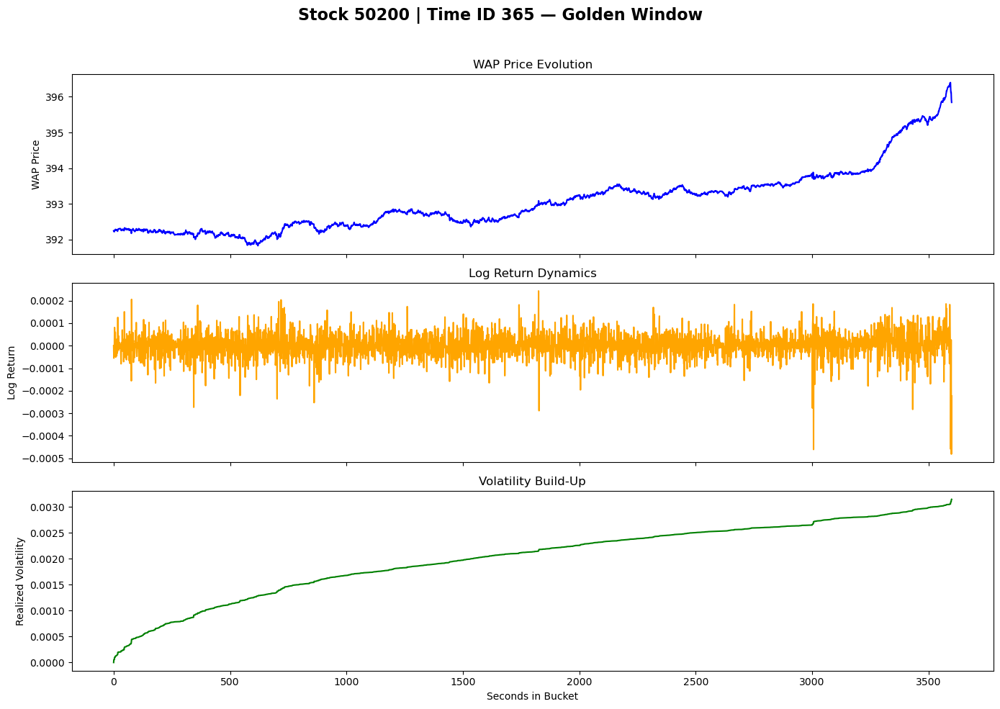

In [140]:
plot_golden_window(df_filtered, stock_id=50200, time_id=365)


### smooth price insertion in wap = most stable 

### log r mostly stable low direction risk 

### slow amooth vola accumulation = well behaved

# 3. Growth Rate vs Volatility Tradeoff


In [143]:

# 3. Liquidity and Noise Analysis (using trades.csv)
# Check:

# Order count per second/minute → proxy for liquidity

# Trade size distribution → bigger trades = more institutional interest

# Price movement vs volume spikes → does volatility correlate with trade bursts?

# Hypothesis: Periods of low liquidity may have higher realized volatility


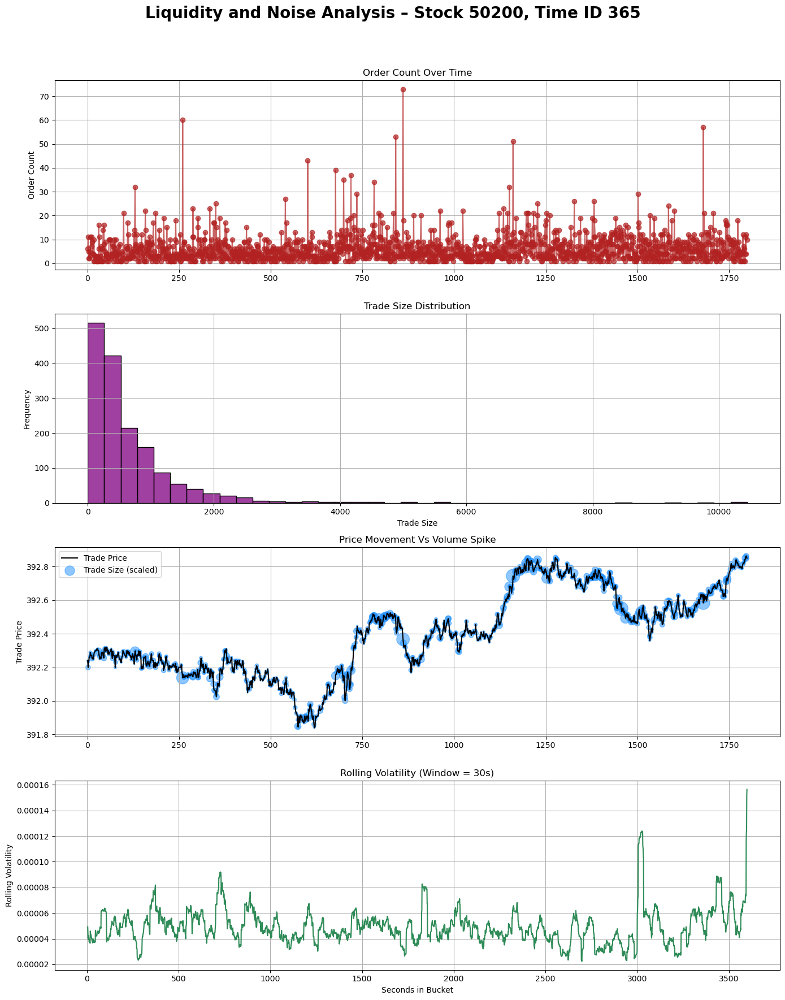

In [144]:

import matplotlib.pyplot as plt
import seaborn as sns

def analyze_liquidity_and_noise(trades_df, log_return_df, stock_id, time_id):
    # 1. Filter data for the specific stock_id and time_id
    tdf = trades_df[(trades_df['stock_id'] == stock_id) & (trades_df['time_id'] == time_id)].sort_values('seconds_in_bucket')
    rdf = log_return_df[(log_return_df['stock_id'] == stock_id) & (log_return_df['time_id'] == time_id)].sort_values('seconds_in_bucket')

    if tdf.empty:
        print(f"No trades found for stock_id={stock_id}, time_id={time_id}.")
        return

    fig, axs = plt.subplots(4, 1, figsize=(14, 18), sharex=False)

    fig.suptitle(f"Liquidity and Noise Analysis – Stock {stock_id}, Time ID {time_id}", fontsize=20, weight='bold')

    # 2. Plot Order Count (Liquidity Proxy)
    axs[0].plot(tdf['seconds_in_bucket'], tdf['order_count'], marker='o', linestyle='-', color='firebrick', alpha=0.7)
    axs[0].set_ylabel("Order Count")
    axs[0].set_title("Order Count Over Time")
    axs[0].grid(True)

    # 3. Trade Size Distribution (Histogram)
    sns.histplot(tdf['size'], bins=40, kde=False, ax=axs[1], color='purple')
    axs[1].set_title("Trade Size Distribution")
    axs[1].set_xlabel("Trade Size")
    axs[1].set_ylabel("Frequency")
    axs[1].grid(True)

    # 4. Trade Price vs Volume Spikes
    axs[2].plot(tdf['seconds_in_bucket'], tdf['price'], color='black', label='Trade Price')
    axs[2].scatter(tdf['seconds_in_bucket'], tdf['price'], 
                   s=(tdf['size'] / tdf['size'].max()) * 300,   # Normalize marker size nicely
                   alpha=0.5, color='dodgerblue', label='Trade Size (scaled)')
    axs[2].legend()
    axs[2].set_ylabel("Trade Price")
    axs[2].set_title("Price Movement Vs Volume Spike")
    axs[2].grid(True)

    # 5. Rolling Volatility (from log returns)
    window_size = 30  # seconds
    rdf['rolling_vol'] = rdf['log_return'].rolling(window=window_size, min_periods=5).std()
    axs[3].plot(rdf['seconds_in_bucket'], rdf['rolling_vol'], color='seagreen')
    axs[3].set_ylabel("Rolling Volatility")
    axs[3].set_xlabel("Seconds in Bucket")
    axs[3].set_title(f"Rolling Volatility (Window = {window_size}s)")
    axs[3].grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


analyze_liquidity_and_noise(trades, df_combined, stock_id=50200, time_id=365)


In [147]:
#  golden point best peroformer (stock_id = 50200, time_id = 365) came from order_book.csv

# You selected it because it had:

# Low realized volatility



In [152]:
# insight for understanding market microstructure and spotting volatility driver


# 4. Microstructure Noise-  Compare order book price movement vs trade price movement



In [158]:
# Compare order book price movement (trades) vs trade price movement (feature+ target)
# Order book shows quotes (intentions)

# Trades show executed prices (real transactions)



# Are there differences? (Bid-ask bounce effect?)

# Higher noise usually implies overestimated volatility at very short timeframes

In [176]:
import matplotlib.pyplot as plt

def detect_trade_direction(trades_df, orderbook_df, stock_id, time_id):
    # 1. Filter data
    tdf = trades_df[(trades_df['stock_id'] == stock_id) & (trades_df['time_id'] == time_id)].sort_values('seconds_in_bucket')
    odf = orderbook_df[(orderbook_df['stock_id'] == stock_id) & (orderbook_df['time_id'] == time_id)].sort_values('seconds_in_bucket')

    if tdf.empty or odf.empty:
        print(f"No matching trades or order book data for stock_id={stock_id}, time_id={time_id}.")
        return

    # 2. Merge trades with order book data to get bid/ask prices
    merged = pd.merge_asof(
        tdf[['seconds_in_bucket', 'price', 'size']],
        odf[['seconds_in_bucket', 'bid_price1', 'ask_price1']],
        on='seconds_in_bucket',
        direction='nearest',
        tolerance=1
    ).dropna()

    # 3. Classify trade side
    def classify_trade(row):
        if abs(row['price'] - row['ask_price1']) <= abs(row['price'] - row['bid_price1']):
            return 'Buy'  # Closer to ask → Buyer aggressive
        else:
            return 'Sell'  # Closer to bid → Seller aggressive

    merged['trade_side'] = merged.apply(classify_trade, axis=1)

    return merged  # return full labeled trades


In [178]:
labeled_trades = detect_trade_direction(trades, df_combined, stock_id=50200, time_id=365)
print(labeled_trades[['seconds_in_bucket', 'price', 'bid_price1', 'ask_price1', 'trade_side']].head())


   seconds_in_bucket       price  bid_price1  ask_price1 trade_side
0                1.0  392.239910      392.22      392.23        Buy
1                2.0  392.199259      392.22      392.23       Sell
2                3.0  392.234673      392.22      392.23        Buy
3                4.0  392.240000      392.25      392.26       Sell
4                5.0  392.260000      392.25      392.26        Buy


In [180]:
def measure_microstructure_noise(labeled_trades):
    # Compute mid-point
    labeled_trades['midpoint'] = (labeled_trades['bid_price1'] + labeled_trades['ask_price1']) / 2
    # Absolute deviation from fair price
    labeled_trades['abs_deviation'] = (labeled_trades['price'] - labeled_trades['midpoint']).abs()
    
    avg_noise = labeled_trades['abs_deviation'].mean()
    max_noise = labeled_trades['abs_deviation'].max()
    
    print(f"📈 Average Microstructure Noise (abs deviation): {avg_noise:.6f}")
    print(f"🚀 Maximum Microstructure Noise (abs deviation): {max_noise:.6f}")

    return labeled_trades


Input any stock and time id

In [186]:
# 1. Detect trade directions
labeled_trades = detect_trade_direction(trades, df_combined, stock_id=50200, time_id=365)



# 3. Measure noise
measure_microstructure_noise(labeled_trades)


📈 Average Microstructure Noise (abs deviation): 0.008878
🚀 Maximum Microstructure Noise (abs deviation): 0.050652


,seconds_in_bucket,price,size,bid_price1,ask_price1,trade_side,midpoint,abs_deviation
0,1.0,392.239910,223.0,392.22,392.23,Buy,392.225,0.014910
1,2.0,392.199259,1296.0,392.22,392.23,Sell,392.225,0.025741
2,3.0,392.234673,428.0,392.22,392.23,Buy,392.225,0.009673
3,4.0,392.240000,101.0,392.25,392.26,Sell,392.255,0.015000
4,5.0,392.260000,200.0,392.25,392.26,Buy,392.255,0.005000
...,...,...,...,...,...,...,...,...
1585,1794.0,392.840000,400.0,392.83,392.84,Buy,392.835,0.005000
1586,1795.0,392.850000,2706.0,392.85,392.86,Sell,392.855,0.005000
1587,1796.0,392.860371,727.0,392.86,392.87,Sell,392.865,0.004629
1588,1797.0,392.863151,1606.0,392.84,392.85,Buy,392.845,0.018151


In [188]:
# Green Line	Order Book WAP (Fair Mid-point between Bid and Ask)
# Green Dots	Buy Trades (aggressive buyers at ask)
# Red Dots	Sell Trades (aggressive sellers at bid)
# Gray Dots	Neutral or mid-market trades

In [190]:

def plot_trade_directions(labeled_trades, stock_id, time_id):
    fig, ax = plt.subplots(figsize=(14, 7))
    fig.suptitle(f"Trade Directions – Stock {stock_id}, Time ID {time_id}", fontsize=18, weight='bold')

    colors = {'Buy': 'limegreen', 'Sell': 'red'}
    
    # Plot Buy and Sell separately
    for side, group in labeled_trades.groupby('trade_side'):
        ax.scatter(
            group['seconds_in_bucket'], group['price'],
            s=(group['size'] / group['size'].max()) * 300,
            color=colors.get(side, 'gray'),
            label=f"{side} Trades",
            alpha=0.6
        )

    ax.set_xlabel("Seconds in Bucket")
    ax.set_ylabel("Trade Price")
    ax.legend(title="Trade Side", fontsize=12, title_fontsize=14)
    ax.grid(True)
    plt.show()


Input any stock and time id

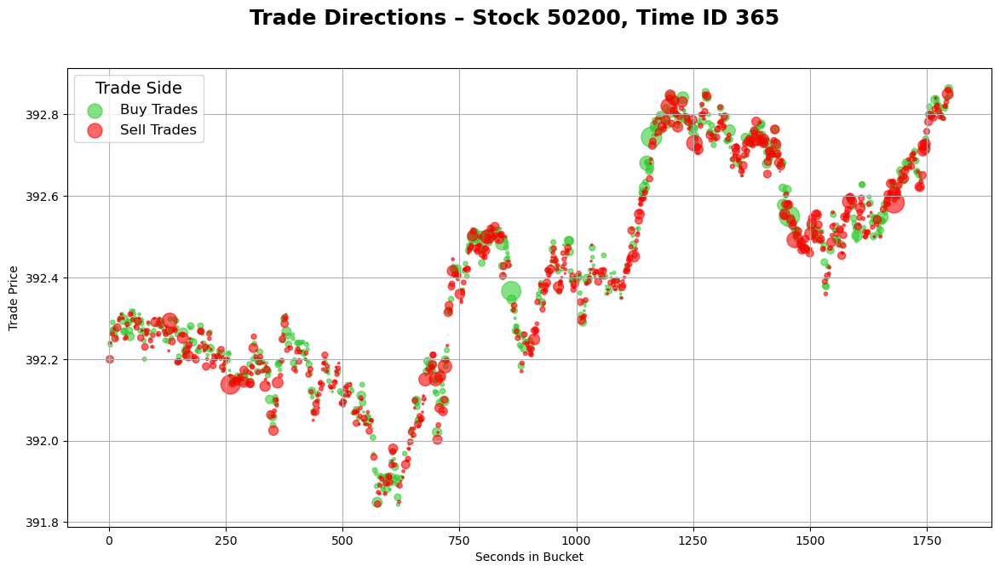

In [193]:
# First detect trade directions
labeled_trades = detect_trade_direction(trades, df_combined, stock_id=50200, time_id=365)

# Then plot trade directions
plot_trade_directions(labeled_trades, stock_id=50200, time_id=365)


# 5. Time of Day Effects (using time_id_reference.csv)


In [196]:


# 5. Time of Day Effects (using time_id_reference.csv)
# Map time_id → actual datetime == Map time_id to real time (using time_id_reference.csv)

# Investigate if volatility changes by time of day (e.g., around open or close)
# Merge this info with your volatility calculations (realized_volatility, mean_log_return, etc.)



# # Morning and afternoon might have very different dynamics
# is vola higher in certain time 
# does it spike ; follow pattern?? garch param 

In [198]:
# Merge it with your log_return_stats
log_return_stats = log_return_stats.merge(time_id_reference, on='time_id', how='left')

# Convert to datetime for easier handling
log_return_stats['datetime'] = pd.to_datetime(log_return_stats['date'] + ' ' + log_return_stats['time'])

# Extract hour from datetime
log_return_stats['hour'] = log_return_stats['datetime'].dt.hour

log_return_stats

,stock_id,time_id,mean_log_return,realized_volatility,label,date,time,datetime,hour
0,8382,6,-3.316286e-06,0.011885,Stock: 8382<br>Time ID: 6<br>Mean Log Return: ...,NaN,NaN,NaT,NaN
1,8382,7,-1.785381e-06,0.009352,Stock: 8382<br>Time ID: 7<br>Mean Log Return: ...,NaN,NaN,NaT,NaN
2,8382,8,4.414603e-08,0.009113,Stock: 8382<br>Time ID: 8<br>Mean Log Return: ...,NaN,NaN,NaT,NaN
3,8382,9,7.453871e-07,0.006929,Stock: 8382<br>Time ID: 9<br>Mean Log Return: ...,NaN,NaN,NaT,NaN
4,8382,10,9.269810e-07,0.007495,Stock: 8382<br>Time ID: 10<br>Mean Log Return:...,NaN,NaN,NaT,NaN
...,...,...,...,...,...,...,...,...,...
11575,104919,1195,3.046436e-07,0.001839,Stock: 104919<br>Time ID: 1195<br>Mean Log Ret...,2021-10-07,12:00:00,2021-10-07 12:00:00,12.0
11576,104919,1196,-2.271572e-07,0.001595,Stock: 104919<br>Time ID: 1196<br>Mean Log Ret...,2021-10-07,13:00:00,2021-10-07 13:00:00,13.0
11577,104919,1197,-4.365456e-07,0.001546,Stock: 104919<br>Time ID: 1197<br>Mean Log Ret...,2021-10-07,14:00:00,2021-10-07 14:00:00,14.0
11578,104919,1198,-6.712164e-07,0.002143,Stock: 104919<br>Time ID: 1198<br>Mean Log Ret...,2021-10-07,15:00:00,2021-10-07 15:00:00,15.0


In [200]:
# Group by hour and compute average realized volatility
hourly_volatility = log_return_stats.groupby('hour')['realized_volatility'].mean().reset_index()



computing the average volatility for each hour of the day (11 AM, 12 PM, etc.)

Regardless of which stock_id the values come from

In [205]:
hourly_volatility

,hour,realized_volatility
0,11.0,0.008465
1,12.0,0.006400
2,13.0,0.005394
3,14.0,0.005060
4,15.0,0.005257
5,16.0,0.005517


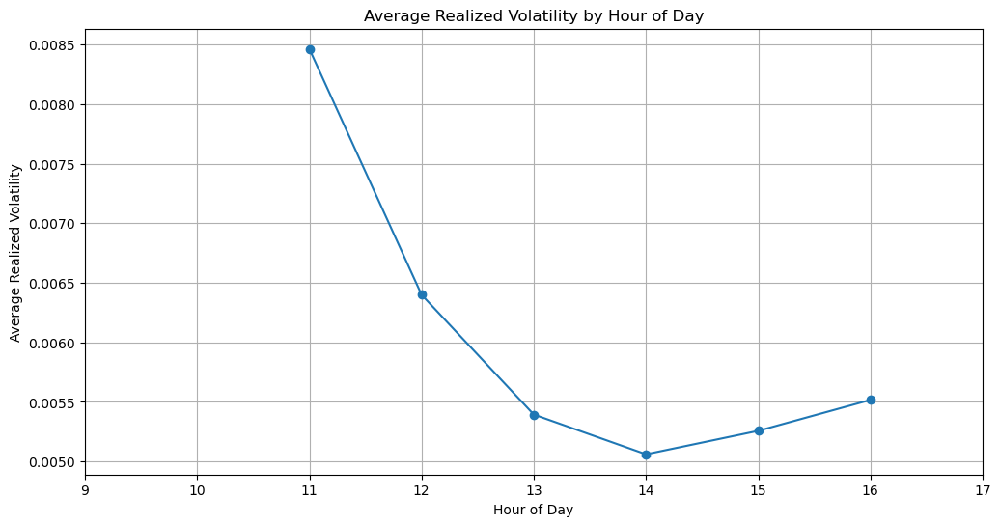

In [207]:

plt.figure(figsize=(12,6))
plt.plot(hourly_volatility['hour'], hourly_volatility['realized_volatility'], marker='o')
plt.title("Average Realized Volatility by Hour of Day")
plt.xlabel("Hour of Day")
plt.ylabel("Average Realized Volatility")
plt.grid(True)
plt.xticks(range(9, 18))  # If your trading day is 9 AM to 5 PM
plt.show()


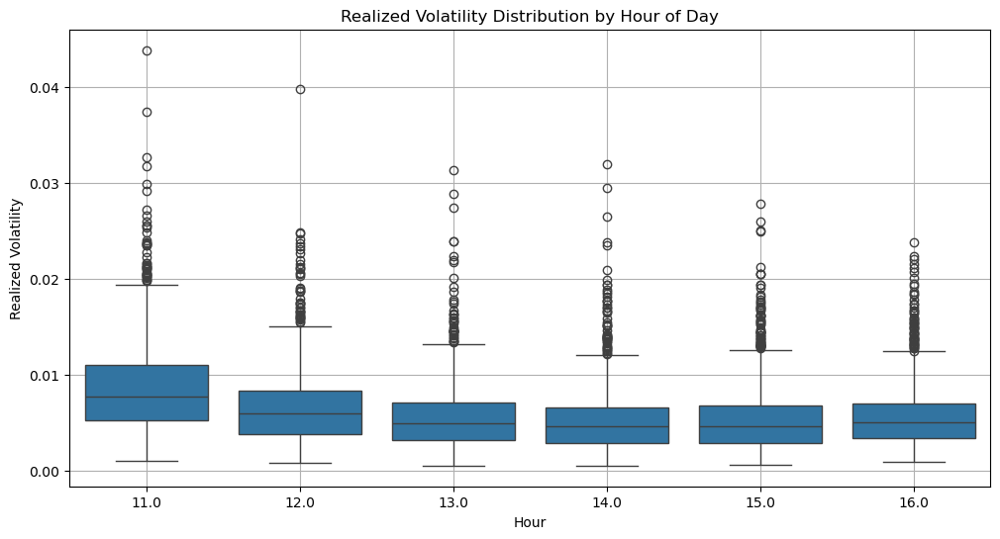

In [209]:

plt.figure(figsize=(12, 6))
sns.boxplot(data=log_return_stats, x='hour', y='realized_volatility')
plt.title("Realized Volatility Distribution by Hour of Day")
plt.xlabel("Hour")
plt.ylabel("Realized Volatility")
plt.grid(True)
plt.show()


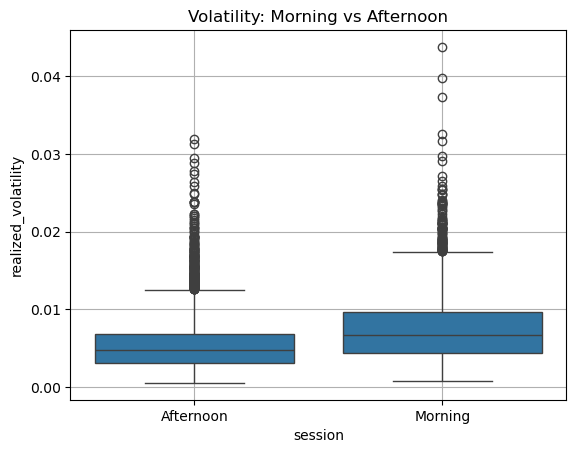

In [210]:
log_return_stats['session'] = log_return_stats['hour'].apply(lambda h: 'Morning' if h < 13 else 'Afternoon')

sns.boxplot(data=log_return_stats, x='session', y='realized_volatility')
plt.title("Volatility: Morning vs Afternoon")
plt.grid(True)
plt.show()


# "best performeer"

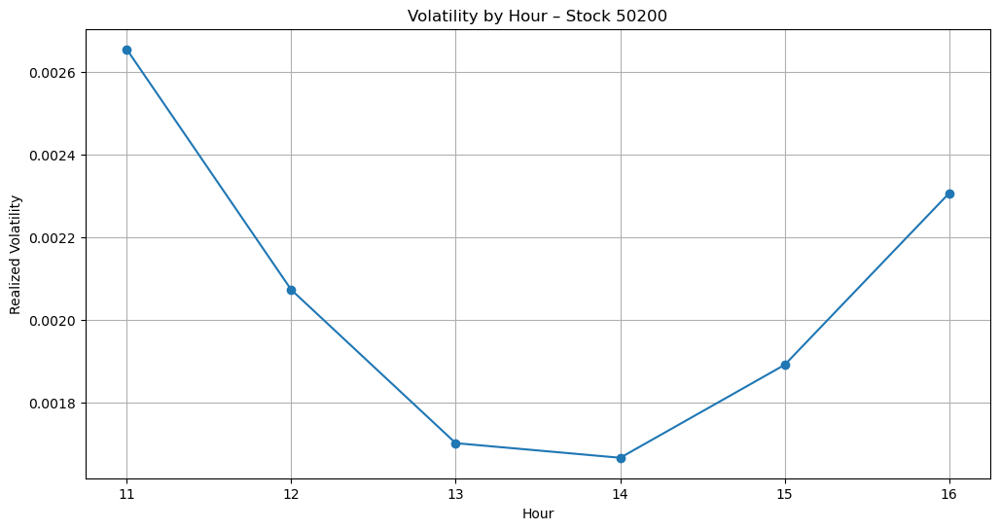

In [216]:
hourly_by_stock = log_return_stats.groupby(['stock_id', 'hour'])['realized_volatility'].mean().reset_index()
stock_50200 = hourly_by_stock[hourly_by_stock['stock_id'] == 50200]

plt.figure(figsize=(12, 6))
plt.plot(stock_50200['hour'], stock_50200['realized_volatility'], marker='o')
plt.title("Volatility by Hour – Stock 50200")
plt.xlabel("Hour")
plt.ylabel("Realized Volatility")
plt.grid(True)
plt.show()


# let's find the worst performer 

In [219]:
# Ensure no NaN values in hour
log_return_stats_clean = log_return_stats.dropna(subset=['hour'])

# Sort by mean log return (lowest = worst)
worst = log_return_stats_clean.sort_values(by='mean_log_return').head(1)

print("📉 Worst Performing Time Window:")
print(worst[['stock_id', 'time_id', 'mean_log_return', 'realized_volatility', 'datetime', 'hour']])


📉 Worst Performing Time Window:
     stock_id  time_id  mean_log_return  realized_volatility  \
248      8382      266        -0.000011             0.028858   

               datetime  hour  
248 2021-03-04 13:00:00  13.0  


In [221]:
worst_10 = log_return_stats_clean.sort_values(by='mean_log_return').head(10)
print(worst_10[['stock_id', 'time_id', 'mean_log_return', 'realized_volatility', 'datetime', 'hour']])


      stock_id  time_id  mean_log_return  realized_volatility  \
248       8382      266        -0.000011             0.028858   
627       8382      657        -0.000011             0.015021   
259       8382      277        -0.000010             0.023656   
110       8382      122        -0.000010             0.023872   
84        8382       96        -0.000010             0.016136   
541       8382      565        -0.000009             0.017013   
2197      9323     1081        -0.000009             0.014557   
323       8382      341        -0.000009             0.013916   
205       8382      223        -0.000009             0.024754   
6588     22771      834        -0.000009             0.012693   

                datetime  hour  
248  2021-03-04 13:00:00  13.0  
627  2021-06-03 14:00:00  14.0  
259  2021-03-08 12:00:00  12.0  
110  2021-01-29 13:00:00  13.0  
84   2021-01-25 11:00:00  11.0  
541  2021-05-13 12:00:00  12.0  
2197 2021-09-10 12:00:00  12.0  
323  2021-03-22 16:0

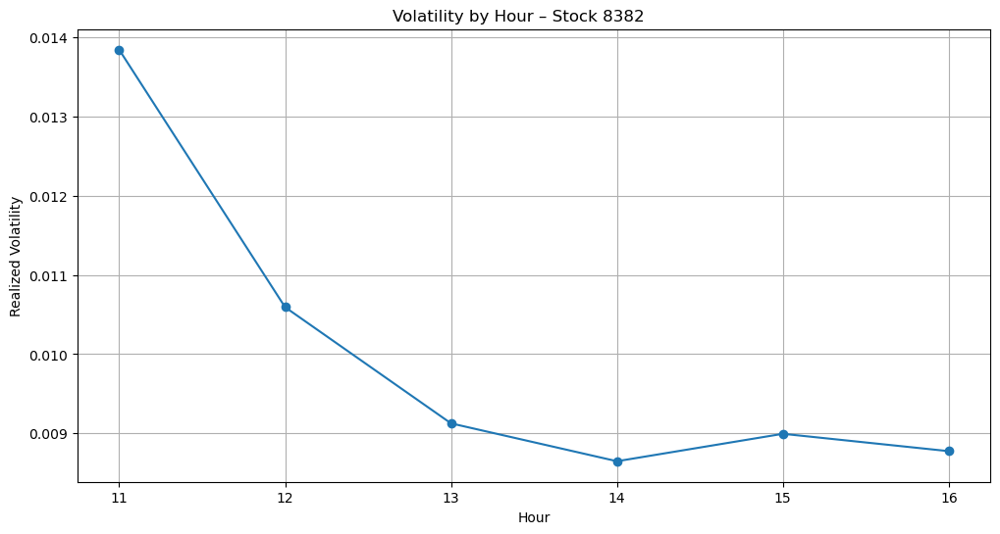

In [223]:
hourly_by_stock = log_return_stats.groupby(['stock_id', 'hour'])['realized_volatility'].mean().reset_index()
stock_50200 = hourly_by_stock[hourly_by_stock['stock_id'] == 8382      ]

plt.figure(figsize=(12, 6))
plt.plot(stock_50200['hour'], stock_50200['realized_volatility'], marker='o')
plt.title("Volatility by Hour – Stock 8382      ")
plt.xlabel("Hour")
plt.ylabel("Realized Volatility")
plt.grid(True)
plt.show()


In [7]:
# # Define base output folder
# output_dir = "C:/Users/ryatu/Documents/New folder/Data3888_Optiver_9/PRI/"

# # Save 30s datasets
# train1_30s_clustered.to_csv(output_dir + "train1_30s_clustered.csv", index=False)
# test1_30s.to_csv(output_dir + "test1_30s.csv", index=False)

# # Save 60s datasets (if they exist)
# try:
#     train1_60s_clustered.to_csv(output_dir + "train1_60s_clustered.csv", index=False)
#     test1_60s.to_csv(output_dir + "test1_60s.csv", index=False)
# except NameError:
#     print("60s DataFrames not found in memory. Skipping those.")
print(os.path.expanduser("~"))



C:\Users\ryatu


In [61]:
import pandas as pd
import numpy as np
from arch import arch_model
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error

# ── load clustered train & raw test ──
BASE     = r"C:/Users/ryatu/Documents/New folder/Data3888_Optiver_9/PRI/"
train    = pd.read_csv(BASE + "train1_30s_clustered.csv")
test     = pd.read_csv(BASE + "test1_30s.csv")

# re-assign clusters to test
features = ['spread','imbalance','depth','depth_ratio','rv_rolling','mom_rolling']
km       = KMeans(n_clusters=train['cluster'].nunique(), random_state=0)
km.fit(train[features])
test['cluster'] = km.predict(test[features])

# prepare forecast column
test['predicted_volatility'] = np.nan

# ── EGARCH fitting & forecasting ──
for cid in sorted(train['cluster'].dropna().unique()):
    sub = train[train['cluster']==cid].sort_values(
        ['stock_id','time_id','bucket_start']
    )
    rets = sub['log_ret_mean'].dropna().astype(float)
    if len(rets) < 50:
        continue

    mu, sigma = rets.mean(), rets.std()
    if sigma == 0 or not np.isfinite(sigma):
        continue

    # standardize
    rets_std = (rets - mu) / sigma

    # fit EGARCH(1,1) on standardized returns
    am = arch_model(
        rets_std,
        vol="EGARCH", p=1, o=1, q=1,
        mean="Zero", dist="t",
        rescale=False
    )
    res = am.fit(disp="off", options={"solver":"powell"})
    

    # 1-step ahead forecast (std-scale)
    f_std    = res.forecast(horizon=1, reindex=False)
    vol_std  = np.sqrt(f_std.variance.values[-1,0])

    # back to original scale
    idx = test[test['cluster']==cid].index
    test.loc[idx, 'predicted_volatility'] = vol_std * sigma

# ── Evaluate ──
valid      = test[['realized_volatility','predicted_volatility']].dropna()
mse_egarch = mean_squared_error(
    valid['realized_volatility'],
    valid['predicted_volatility']
)
print(f"EGARCH Overall MSE: {mse_egarch:.3e}")

for cid, grp in valid.groupby(test['cluster']):
    m = mean_squared_error(
        grp['realized_volatility'], 
        grp['predicted_volatility']
    )
    print(f" Cluster {cid}: MSE = {m:.3e}")


C:\Users\ryatu\anaconda3\Lib\site-packages\arch\univariate\base.py:750: OptimizeWarning: Unknown solver options: solver
  opt = minimize(
C:\Users\ryatu\anaconda3\Lib\site-packages\arch\univariate\base.py:750: OptimizeWarning: Unknown solver options: solver
  opt = minimize(
C:\Users\ryatu\anaconda3\Lib\site-packages\arch\univariate\base.py:750: OptimizeWarning: Unknown solver options: solver
  opt = minimize(


EGARCH Overall MSE: 1.351e+298
 Cluster 0: MSE = 1.839e+298
 Cluster 1: MSE = 6.541e-08
 Cluster 2: MSE = 1.711e+04


In [37]:
df = pd.read_csv(base + "test1_30s_forecasted.csv")
print("Predicted vol range:", df['predicted_volatility'].min(), "–", df['predicted_volatility'].max())
print("New MSE:", mean_squared_error(df['realized_volatility'], df['predicted_volatility']))


Predicted vol range: 1.151563283097981e-05 – 3.667031703898446e-05
New MSE: 1.771559064373759e-07


In [40]:
import pandas as pd
from sklearn.metrics import mean_squared_error

base = r"C:/Users/ryatu/Documents/New folder/Data3888_Optiver_9/PRI/"
df   = pd.read_csv(base + "test1_30s_forecasted.csv")

# Overall MSE
mse_overall = mean_squared_error(
    df['realized_volatility'],
    df['predicted_volatility']
)
print(f"Overall MSE: {mse_overall:.8f} ({mse_overall:.3e})\n")

# MSE by cluster
for cid, sub in df.groupby('cluster'):
    mse_c = mean_squared_error(
        sub['realized_volatility'],
        sub['predicted_volatility']
    )
    print(f"Cluster {cid}: MSE = {mse_c:.8f} ({mse_c:.3e})")


Overall MSE: 0.00000018 (1.772e-07)

Cluster 0: MSE = 0.00000022 (2.179e-07)
Cluster 1: MSE = 0.00000006 (6.405e-08)
Cluster 2: MSE = 0.00000002 (2.451e-08)


In [46]:
import pandas as pd
from sklearn.metrics import mean_squared_error

base = "C:/Users/ryatu/Documents/New folder/Data3888_Optiver_9/PRI/"

# 1) Load the forecasted CSV
df = pd.read_csv(base + "test1_30s_forecasted.csv")

# 2) Quick peek at the columns and head
print(df.columns)
print(df.head())

# 3) If you have realized_volatility, compute MSE again
if 'realized_volatility' in df:
    mse = mean_squared_error(df['realized_volatility'], df['predicted_volatility'])
    print(f"Recomputed Overall MSE: {mse:.6f}")


Index(['stock_id', 'time_id', 'bucket_start', 'log_ret_mean', 'log_ret_std',
       'log_ret_sum', 'abs_volatility', 'realized_volatility', 'spread',
       'imbalance', 'depth', 'depth_ratio', 'rv_rolling', 'mom_rolling',
       'date', 'time', 'day', 'day_of_week', 'day_name', 'week', 'cluster',
       'predicted_volatility'],
      dtype='object')
   stock_id  time_id  bucket_start  log_ret_mean  log_ret_std  log_ret_sum  \
0    8382.0     36.0             0      0.000006     0.000320     0.000161   
1    8382.0     36.0            30     -0.000081     0.000460    -0.002423   
2    8382.0     36.0            60     -0.000055     0.000217    -0.001638   
3    8382.0     36.0            90      0.000024     0.000333     0.000718   
4    8382.0     36.0           120      0.000074     0.000438     0.002216   

   abs_volatility  realized_volatility    spread  imbalance  ...  rv_rolling  \
0        0.006721             0.001664  0.419821  -0.480306  ...    0.000060   
1        0.010286 